In [1]:
import argparse
import numpy as np
import healpy as hp
import pickle
import pysm3
import pysm3.units as u
from mnms import utils as mutils
import utils as autils
from sofind import DataModel
from solenspipe.utility import w_n
from matplotlib.lines import Line2D
from matplotlib import rcParams
from matplotlib import cm
from matplotlib.colors import to_hex
from pixell import curvedsky as cs, reproject
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams['font.size']=20
rcParams['axes.linewidth']=1.5
rcParams['xtick.major.width']=1.5
rcParams['xtick.minor.width']=1
rcParams['ytick.major.width']=1.5
rcParams['ytick.minor.width']=1
rcParams['xtick.major.pad']='8'
rcParams['xtick.direction'] = 'in'
rcParams['xtick.top'] = True
rcParams['ytick.direction'] = 'in'
rcParams['xtick.minor.visible'] = True
rcParams['ytick.minor.visible'] = True
rcParams['ytick.right'] = True
rcParams['text.usetex'] = True
rcParams['font.family'] = 'Helvetica'

%matplotlib inline

# Función para obtener colores discretos de un colormap
def get_discrete_colors(cmap_name, num_colors):
    cmap = cm.get_cmap(cmap_name, num_colors)
    return [to_hex(cmap(i)) for i in range(num_colors)]

--------------------------------------------------------------------------
detected:

  Local host:            cpu-r-11
  Device name:           mlx5_0
  Device vendor ID:      0x02c9
  Device vendor part ID: 4129

Default device parameters will be used, which may result in lower
performance.  You can edit any of the files specified by the
btl_openib_device_param_files MCA parameter to set values for your
device.

NOTE: You can turn off this warning by setting the MCA parameter
      btl_openib_warn_no_device_params_found to 0.
--------------------------------------------------------------------------
--------------------------------------------------------------------------

  Local host:   cpu-r-11
  Local device: mlx5_0
--------------------------------------------------------------------------


In [2]:
args = argparse.Namespace()

args.output_dir = '/rds/project/dirac_vol5/rds-dirac-dp002/ia404/fgs/local_dustbias/'
args.dust_freq = 90
args.skyfrac='GAL060'
args.mlmax=4000
args.mask_subproduct='lensing_masks'
args.mask_type='dr6v4_lensing_20240919'
args.apodfact='_d2_apo3deg'
args.daynight='night'
args.config_name='act_dr6v4'
args.width_ra=15
args.width_dec=10
args.hpmask_fname = '/rds/project/dirac_vol5/rds-dirac-dp002/ia404/fgs/Planck/HFI_Mask_GalPlane-apo5_2048_R2.00.fits'
args.nside=2048
args.amplitudes_path = '/home/ia404/gitreps/dustbias/mbatch/local_dustbias/amplitudes.pkl'
args.tilt_gauss = -0.8

dm = DataModel.from_config(args.config_name)

In [3]:
masks_pixell = {}
w2_pixell = {}
for fsky in autils.FSKYS:
    masks_pixell[fsky] = dm.read_mask(mask_fn = f'{args.mask_type}_{args.daynight}_enhanced_mask_{fsky.split("GAL0")[1]}_d2_apo3deg.fits', subproduct=args.mask_subproduct)
    w2_pixell[fsky] = w_n(masks_pixell[fsky],2)

args.shape, args.wcs = masks_pixell[args.skyfrac].shape, masks_pixell[args.skyfrac].wcs

In [4]:
sky_hp_maps = {}
for dust_type in ['d9', 'd10', 'd12']:

    print(dust_type)
    sky_dust = pysm3.Sky(nside=args.nside, preset_strings=[dust_type])
    map_freqGHz = sky_dust.get_emission(args.dust_freq * u.GHz)
    sky_hp_maps[dust_type] = map_freqGHz.to(u.uK_CMB, equivalencies=u.cmb_equivalencies(args.dust_freq*u.GHz))[0]
    
sky_hp_maps['DF'] = hp.read_map(autils.FG_PATH_DICT[f'dust_DF_{args.dust_freq:.1f}'] + '.fits', field=0)
sky_hp_maps['van'] = hp.read_map(autils.FG_PATH_DICT[f'dust_van_{args.dust_freq:.1f}'] + '.fits', field=0)

d9
d10
d12


In [5]:
sky_car_maps = {}
for dust_type in ['d9', 'd10', 'd12', 'DF','van']:
    sky_car_maps[f'{dust_type}_{args.skyfrac}'] = reproject.healpix2map(sky_hp_maps[f'{dust_type}'], masks_pixell[args.skyfrac].shape, masks_pixell[args.skyfrac].wcs, lmax = args.mlmax, rot="gal,cel")

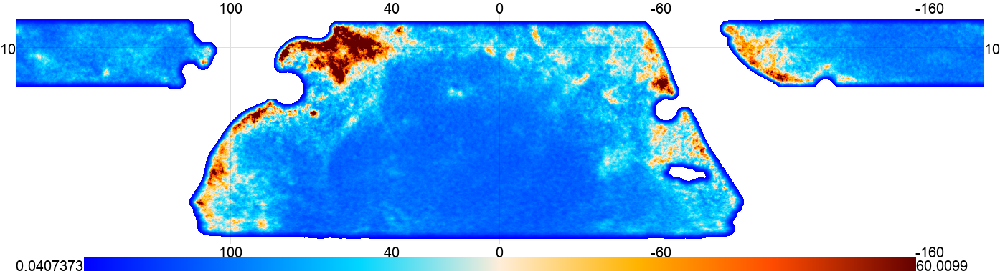

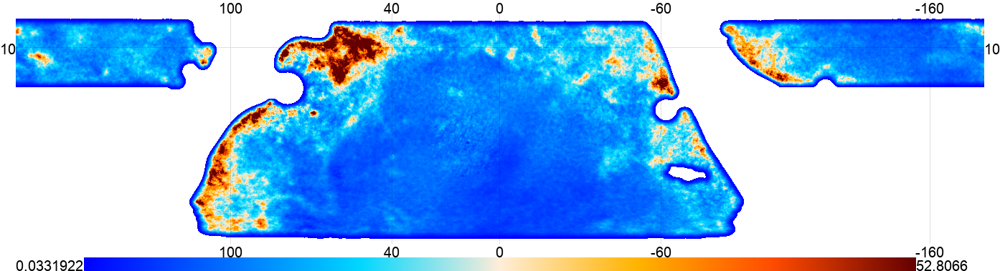

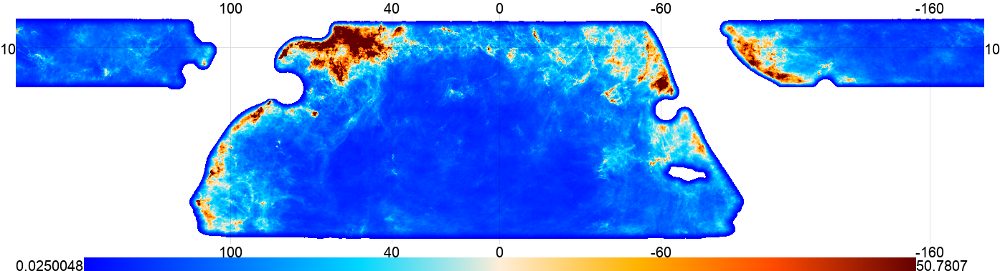

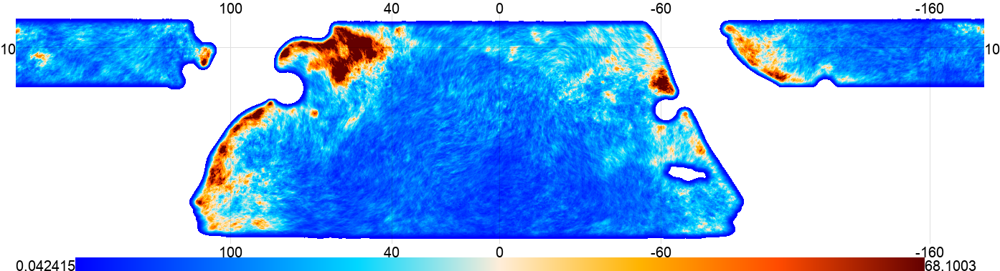

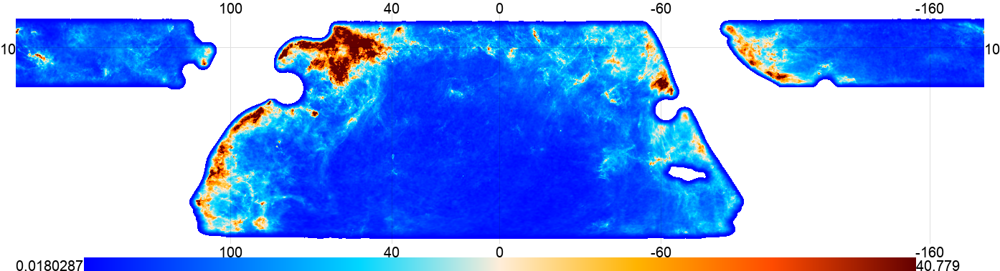

In [6]:
for dust_type in ['d9', 'd10', 'd12', 'DF','van']:
    mutils.eplot(sky_car_maps[f'{dust_type}_{args.skyfrac}'] * masks_pixell[fsky], downgrade=16, colorbar=True, ticks=100, mask =0, show=True)

In [7]:
cl_2pts_GAL060 = {}

for dust_type in ['d9', 'd10', 'd12', 'van', 'DF']: 
        
    dust_alm = cs.map2alm(sky_car_maps[f'{dust_type}_{args.skyfrac}'] * masks_pixell[args.skyfrac], lmax=args.mlmax)
    cl_2pts_GAL060[dust_type] = cs.alm2cl(dust_alm) / w2_pixell[args.skyfrac]

In [8]:
ell = np.arange(args.mlmax+1)
lfac = ell * (ell + 1) / (2 * np.pi)

# Generar colores discretos
num_colors = len(autils.DUST_TYPES)  # Número total de combinaciones de freq, pysm_model y mask
discrete_colors = get_discrete_colors('viridis', num_colors)

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


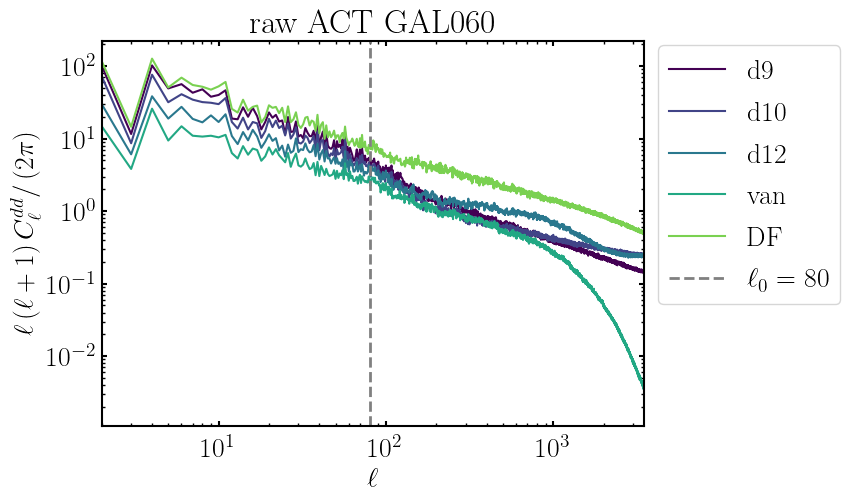

In [9]:
fig, ax = plt.subplots(1, figsize=(7,5))#, sharex=True, sharey=True)

for i,dust_type in enumerate(['d9', 'd10', 'd12', 'van', 'DF']):

    ax.loglog(ell[:-25], (lfac*cl_2pts_GAL060[dust_type])[:-25], color=discrete_colors[i], label=dust_type)
ax.axvline(80, color='gray', linestyle='dashed', lw=2, label=r'$\ell_0 = 80$')
ax.set_xlim(2, 3500)

legend = ax.legend(bbox_to_anchor=(1, 1.025), loc = 'upper left') # (1, 1.025)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\ell\left(\ell+1\right) C_\ell^{dd} / \left(2\pi\right)$')
ax.set_title('raw ACT ' + args.skyfrac)
#fig.savefig('./Figures/2pt_comparison_ACT_GAL060_raw.png', bbox_inches='tight')
plt.show()

In [10]:
with open(args.amplitudes_path, 'rb') as file:
    amplitudes = pickle.load(file)

/home/ia404/gitreps/dustbias/mbatch/local_dustbias/utils.py:48: RuntimeWarning: divide by zero encountered in divide
  return dl * 2 * np.pi / l / (l + 1)


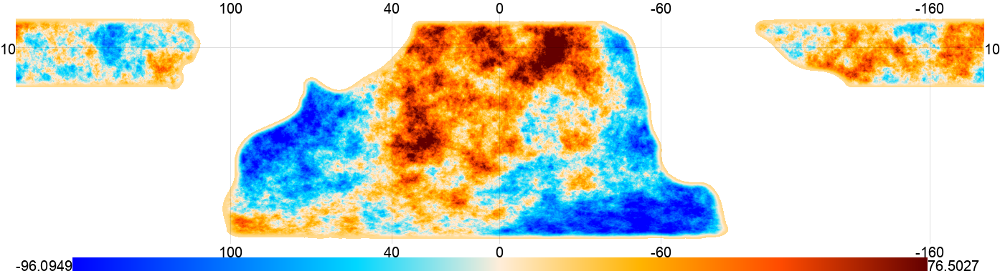

[Bunch(base='', ci=0, cn=1, comp='', dir='', ext='png', fcomp='', fi=0, fn=1, iext='', img=<PIL.Image.Image image mode=RGBA size=1394x379 at 0x14D4F01131C0>, info=Bunch(bounds=array([[ -22,  -19],
        [1372,  360]]), names=['img', 'grid', 'tics', 'colorbar']), layer='', name='.png', pi=0, pn=1, pre='', printer=<pixell.enplot.Printer object at 0x14d4f01aed90>, suf='', type='pil')]

In [11]:
amplitude_gauss = amplitudes[f'{args.dust_freq:.1f}_d9_{args.skyfrac}']
dust_cl_generate = autils.dl_to_cl(autils.power_law(ell, amplitude=amplitude_gauss, tilt=args.tilt_gauss), ell)
dust_cl_generate[0] = 0
np.random.seed(100)


sky_hp_maps[f'gauss_{args.skyfrac}'] = hp.sphtfunc.synfast(dust_cl_generate, nside=args.nside, alm=False) # randomly generated gaussian dust map
sky_car_maps[f'gauss_{args.skyfrac}'] = reproject.healpix2map(sky_hp_maps[f'gauss_{args.skyfrac}'], masks_pixell[args.skyfrac].shape, masks_pixell[args.skyfrac].wcs, lmax = args.mlmax, rot="gal,cel")

mutils.eplot(sky_car_maps[f'gauss_{args.skyfrac}'] * masks_pixell[args.skyfrac], downgrade=16, colorbar=True, ticks=100, mask =0, show=True)

In [12]:
dust_alm = cs.map2alm(sky_car_maps[f'gauss_{args.skyfrac}'] * masks_pixell[args.skyfrac], lmax=args.mlmax)
cl_2pts_GAL060['gauss'] = cs.alm2cl(dust_alm) / w2_pixell[args.skyfrac]

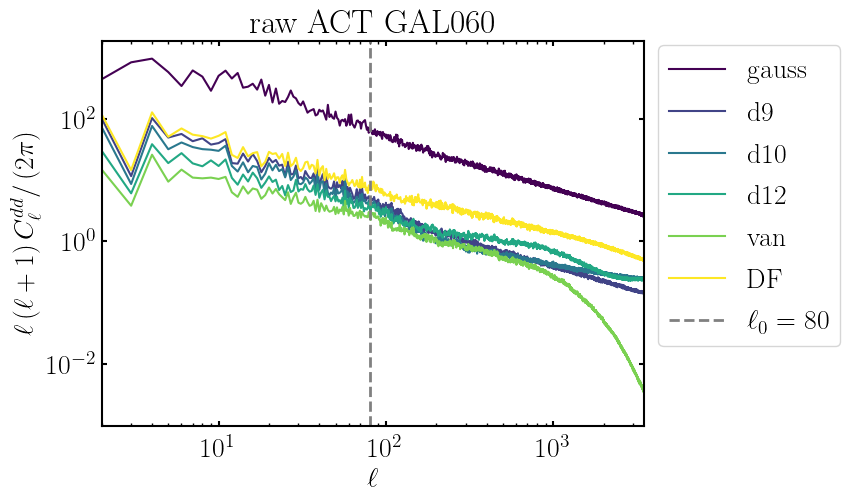

In [58]:
fig, ax = plt.subplots(1, figsize=(7,5))#, sharex=True, sharey=True)


for i,dust_type in enumerate(['gauss','d9', 'd10', 'd12', 'van', 'DF']):

    ax.loglog(ell[:-25], (lfac*cl_2pts_GAL060[dust_type])[:-25], color=discrete_colors[i], label=dust_type)
ax.axvline(80, color='gray', linestyle='dashed', lw=2, label=r'$\ell_0 = 80$')
ax.set_xlim(2, 3500)

legend = ax.legend(bbox_to_anchor=(1, 1.025), loc = 'upper left') # (1, 1.025)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\ell\left(\ell+1\right) C_\ell^{dd} / \left(2\pi\right)$')
ax.set_title('raw ACT ' + args.skyfrac)
fig.savefig('./Figures/2pt_comparison_ACT_GAL060_raw_WITHGAUSS.png', bbox_inches='tight')
plt.show()

In [14]:
cl_2pts_GAL060['gauss'][80]

0.06604421283867191

In [15]:
amplitudes['90.0_d9_GAL060'] / ( 80 * (80+1) / (2*np.pi) )

0.05361866030926985

In [23]:
factor = {}
rescaled_sky_car_maps = {}
for dust_type in ['d9', 'd10', 'd12', 'van', 'DF']:
    factor[f'{dust_type}_{args.skyfrac}'] = np.sqrt((cl_2pts_GAL060['gauss']/cl_2pts_GAL060[dust_type])[80])
    print(factor[f'{dust_type}_{args.skyfrac}'] )
    rescaled_sky_car_maps[f'{dust_type}_{args.skyfrac}'] = sky_car_maps[f'{dust_type}_{args.skyfrac}'] * (factor[f'{dust_type}_{args.skyfrac}'])

3.7439029069330165
4.028200850400509
4.339104972623787
5.102015326539185
2.9478942323040034


In [24]:
cl_2pts_GAL060_rescaled = {}

for dust_type in ['d9', 'd10', 'd12', 'van', 'DF']: 
        
    dust_alm = cs.map2alm(rescaled_sky_car_maps[f'{dust_type}_{args.skyfrac}'] * masks_pixell[args.skyfrac], lmax=args.mlmax)
    cl_2pts_GAL060_rescaled[dust_type] = cs.alm2cl(dust_alm) / w2_pixell[args.skyfrac]

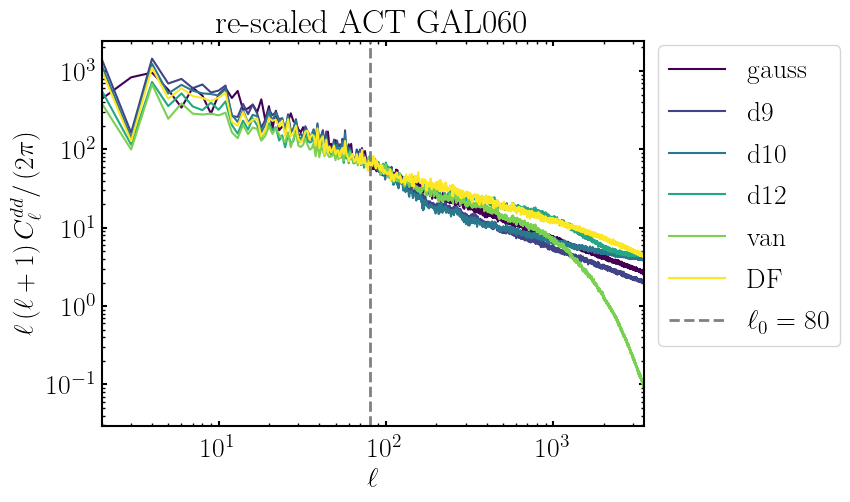

In [59]:
fig, ax = plt.subplots(1, figsize=(7,5))#, sharex=True, sharey=True)

dust_type='gauss'
ax.loglog(ell[:-25], (lfac*cl_2pts_GAL060[dust_type])[:-25], color=discrete_colors[0], label=dust_type)
for i,dust_type in enumerate(['d9', 'd10', 'd12', 'van', 'DF']):

    ax.loglog(ell[:-25], (lfac*cl_2pts_GAL060_rescaled[dust_type])[:-25], color=discrete_colors[i+1], label=dust_type)
ax.axvline(80, color='gray', linestyle='dashed', lw=2, label=r'$\ell_0 = 80$')
ax.set_xlim(2, 3500)

legend = ax.legend(bbox_to_anchor=(1, 1.025), loc = 'upper left') # (1, 1.025)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\ell\left(\ell+1\right) C_\ell^{dd} / \left(2\pi\right)$')
ax.set_title('re-scaled ACT ' + args.skyfrac)
fig.savefig('./Figures/2pt_comparison_ACT_GAL060_rescaled.png', bbox_inches='tight')
plt.show()

# re-scaling in hp masks

In [10]:
hp_masks = {}
w2_hpmasks = {}
for i, fsky in enumerate(autils.FSKYS):
    hp_masks[fsky] =  hp.read_map(args.hpmask_fname, field=2+i)
    w2_hpmasks[fsky] = np.mean(hp_masks[fsky]**2)

In [11]:
hp_car_GAL060 = reproject.healpix2map(hp_masks[f'{args.skyfrac}'], masks_pixell[args.skyfrac].shape, masks_pixell[args.skyfrac].wcs, lmax = args.mlmax, rot="gal,cel")

In [13]:
# measure 2pt in dust
dust_hp_cls = {}
# anafast_cl = hp.anafast(sky_hp_maps[f'gauss_{args.skyfrac}'] * hp_masks[args.skyfrac], lmax=args.mlmax)
# dust_hp_cls[f'gauss_{args.skyfrac}'] = anafast_cl / w2_hpmasks[args.skyfrac]

In [14]:
rescaled_sky_hp_maps = {}
for dust_type in ['d9', 'd10', 'd12', 'van', 'DF']:
    anafast_cl = hp.anafast(sky_hp_maps[dust_type] * hp_masks[args.skyfrac], lmax=args.mlmax)
    dust_hp_cls[f'{dust_type}_{args.skyfrac}'] = anafast_cl / w2_hpmasks[args.skyfrac]
#     factor[f'{dust_type}_{args.skyfrac}'] = (dust_hp_cls[f'{dust_type}_{args.skyfrac}'] / dust_hp_cls[f'gauss_{args.skyfrac}'])[80]
#     rescaled_sky_hp_maps[f'{dust_type}_{args.skyfrac}'] = sky_hp_maps[dust_type] / np.sqrt(factor[f'{dust_type}_{args.skyfrac}'])

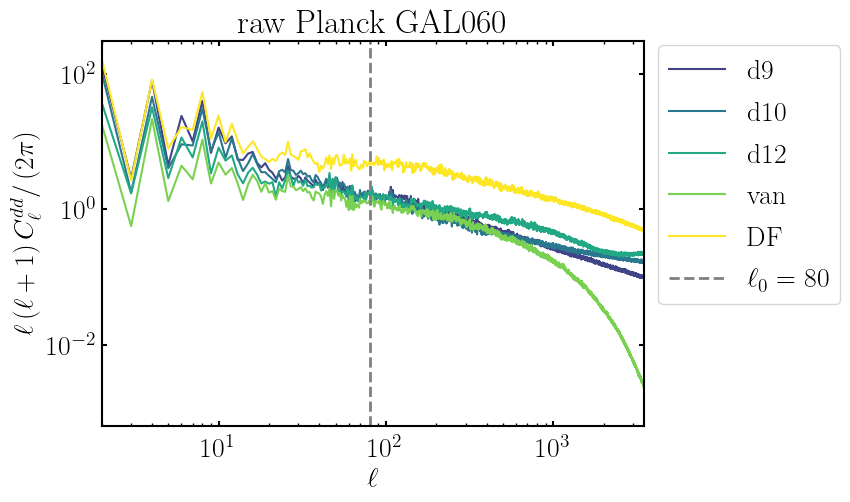

In [18]:
fig, ax = plt.subplots(1, figsize=(7,5))#, sharex=True, sharey=True)

#dust_type='gauss'
#ax.loglog(ell[:-25], (lfac*dust_hp_cls[f'gauss_{args.skyfrac}'])[:-25], color=discrete_colors[0], label=dust_type)
for i,dust_type in enumerate(['d9', 'd10', 'd12', 'van', 'DF']):

    ax.loglog(ell[:-25], (lfac*dust_hp_cls[f'{dust_type}_{args.skyfrac}'])[:-25], color=discrete_colors[i+1], label=dust_type)
ax.axvline(80, color='gray', linestyle='dashed', lw=2, label=r'$\ell_0 = 80$')
ax.set_xlim(2, 3500)

legend = ax.legend(bbox_to_anchor=(1, 1.025), loc = 'upper left') # (1, 1.025)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\ell\left(\ell+1\right) C_\ell^{dd} / \left(2\pi\right)$')
ax.set_title('raw Planck ' + args.skyfrac)
fig.savefig('./Figures/2pt_comparison_raw_Planck_GAL060.png', bbox_inches='tight')
plt.show()

In [30]:
anafast_cl = {}
for dust_type in ['d9', 'd10', 'd12', 'van', 'DF']:
    anafast_cl[dust_type] = hp.anafast(rescaled_sky_hp_maps[f'{dust_type}_{args.skyfrac}'] * hp_masks[args.skyfrac], lmax=args.mlmax)/ w2_hpmasks[args.skyfrac]

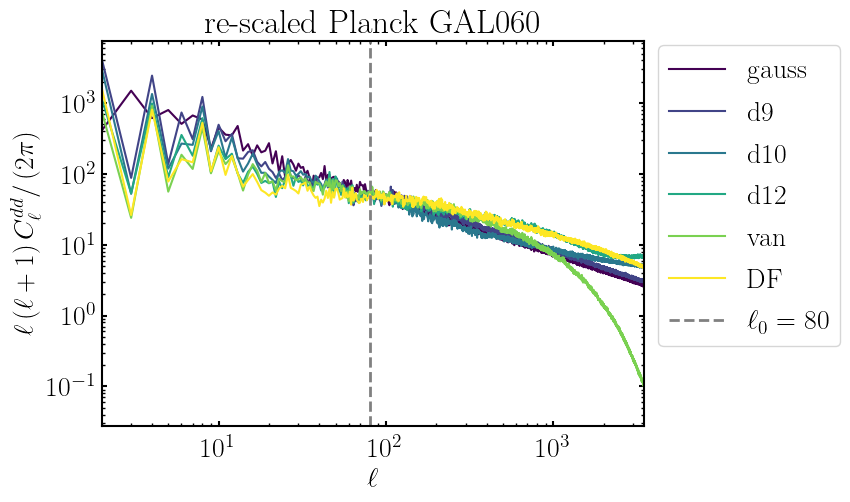

In [60]:
fig, ax = plt.subplots(1, figsize=(7,5))#, sharex=True, sharey=True)

dust_type='gauss'
ax.loglog(ell[:-25], (lfac*dust_hp_cls[f'gauss_{args.skyfrac}'])[:-25], color=discrete_colors[0], label=dust_type)
for i,dust_type in enumerate(['d9', 'd10', 'd12', 'van', 'DF']):

    ax.loglog(ell[:-25], (lfac*anafast_cl[dust_type])[:-25], color=discrete_colors[i+1], label=dust_type)
ax.axvline(80, color='gray', linestyle='dashed', lw=2, label=r'$\ell_0 = 80$')
ax.set_xlim(2, 3500)

legend = ax.legend(bbox_to_anchor=(1, 1.025), loc = 'upper left') # (1, 1.025)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\ell\left(\ell+1\right) C_\ell^{dd} / \left(2\pi\right)$')
ax.set_title('re-scaled Planck ' + args.skyfrac)
fig.savefig('./Figures/2pt_comparison_Planck_GAL060_rescaled.png', bbox_inches='tight')
plt.show()

In [36]:
rescaled_sky_car_map = {}
for dust_type in autils.DUST_TYPES:
    if dust_type == 'gauss':
        rescaled_sky_car_map[dust_type] = reproject.healpix2map(sky_hp_maps[f'{dust_type}_{args.skyfrac}'], masks_pixell[fsky].shape, masks_pixell[fsky].wcs, lmax = args.mlmax, rot="gal,cel")
    else:
        rescaled_sky_car_map[dust_type] = reproject.healpix2map(rescaled_sky_hp_maps[f'{dust_type}_{args.skyfrac}'], masks_pixell[fsky].shape, masks_pixell[fsky].wcs, lmax = args.mlmax, rot="gal,cel")


In [39]:
cl_2pts_GAL060_hp = {}

for dust_type in ['gauss','d9', 'd10', 'd12', 'van', 'DF']: 
        
    dust_alm = cs.map2alm(rescaled_sky_car_map[f'{dust_type}'] * masks_pixell[args.skyfrac], lmax=args.mlmax)
    cl_2pts_GAL060_hp[dust_type] = cs.alm2cl(dust_alm) / w2_pixell[args.skyfrac]

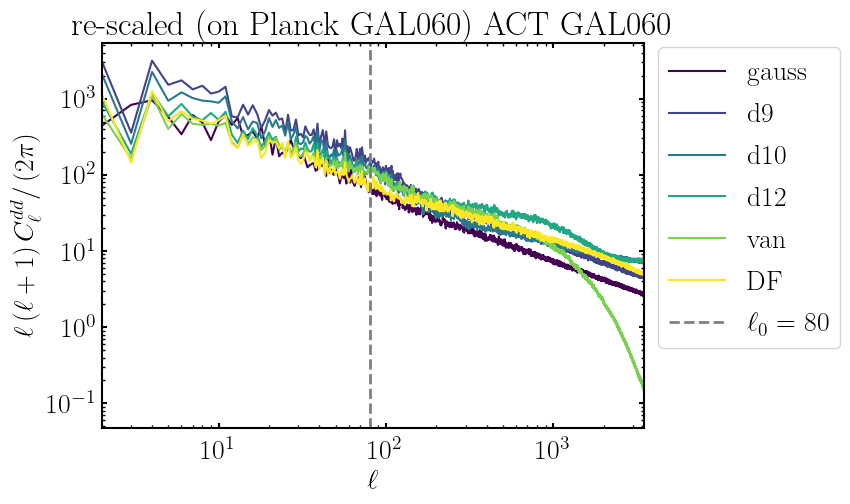

In [62]:
fig, ax = plt.subplots(1, figsize=(7,5))#, sharex=True, sharey=True)

# dust_type='gauss'
# ax.loglog(ell[:-25], (lfac*dust_hp_cls[f'gauss_{args.skyfrac}'])[:-25], color=discrete_colors[0], label=dust_type)
for i,dust_type in enumerate(autils.DUST_TYPES): #['d9', 'd10', 'd12', 'van', 'DF']):

    ax.loglog(ell[:-25], (lfac*cl_2pts_GAL060_hp[dust_type])[:-25], color=discrete_colors[i], label=dust_type)
ax.axvline(80, color='gray', linestyle='dashed', lw=2, label=r'$\ell_0 = 80$')
ax.set_xlim(2, 3500)

legend = ax.legend(bbox_to_anchor=(1, 1.025), loc = 'upper left') # (1, 1.025)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\ell\left(\ell+1\right) C_\ell^{dd} / \left(2\pi\right)$')
ax.set_title('re-scaled (on Planck GAL060) ACT ' + args.skyfrac)
fig.savefig('./Figures/2pt_comparison_ACT_GAL060_rescaled_Planck.png', bbox_inches='tight')
plt.show()

In [48]:
#hp_car_GAL060[np.isclose(hp_car_GAL060,0,atol=1e-4)] = 0

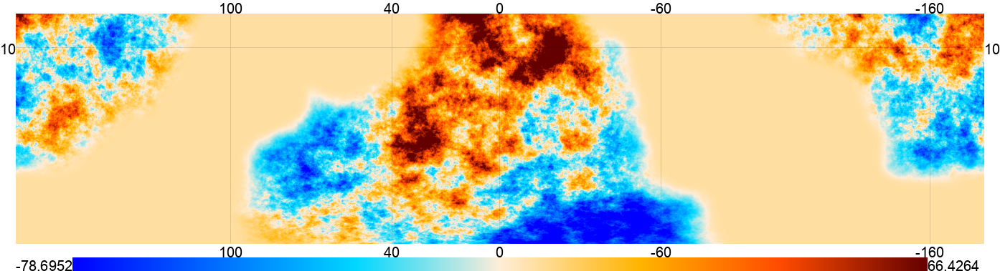

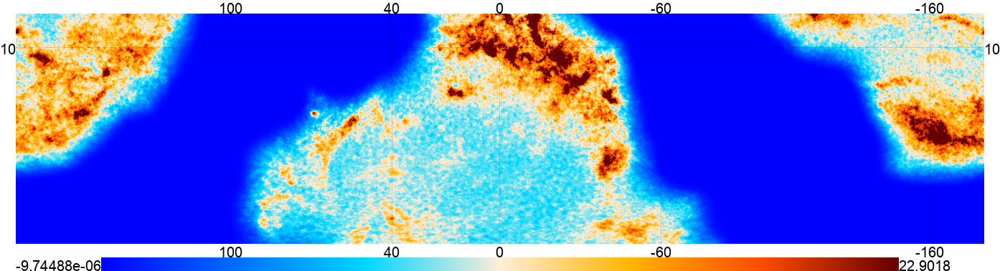

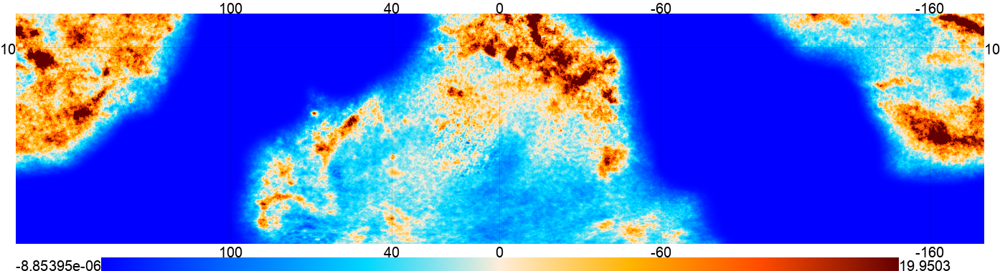

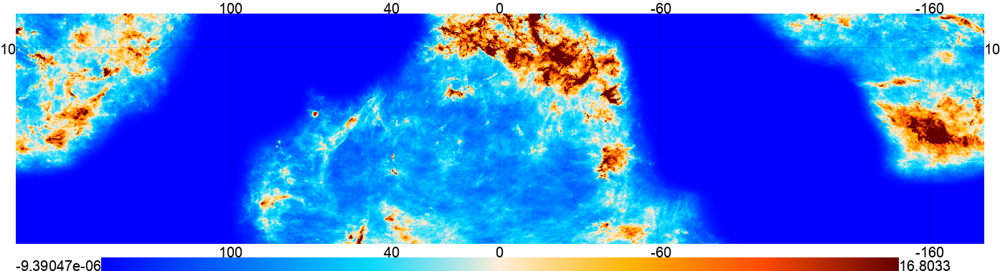

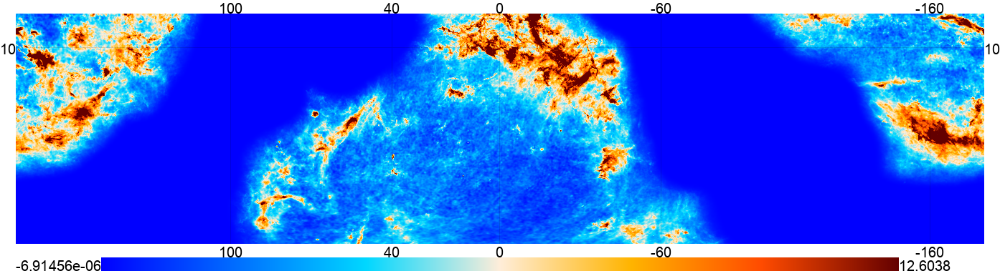

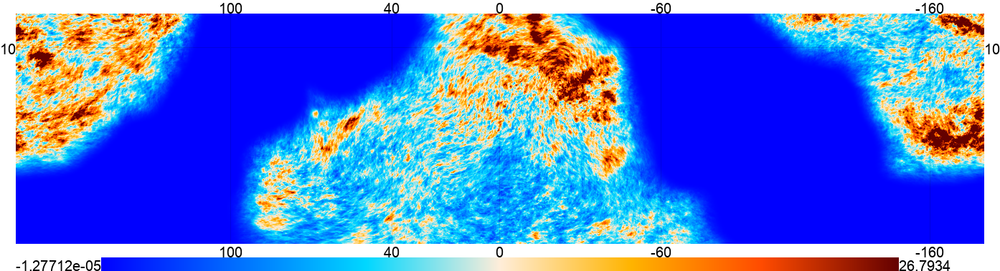

In [53]:
for dust_type in autils.DUST_TYPES:
    mutils.eplot(sky_car_maps[f'{dust_type}_{args.skyfrac}']*hp_car_GAL060 , downgrade=16, colorbar=True, ticks=100, mask =0, show=True)

d9 ACT GAL060 mask


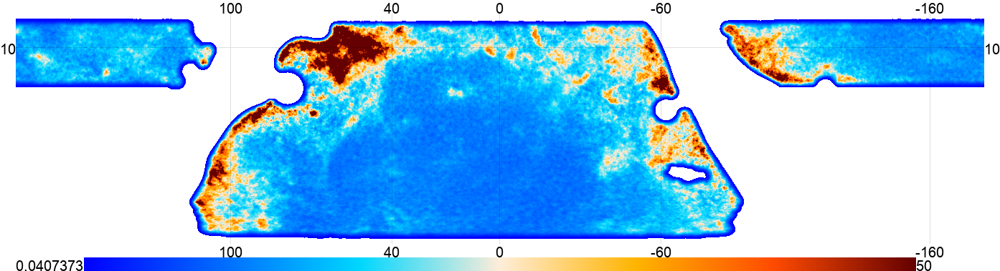

d9 Planck GAL060 mask


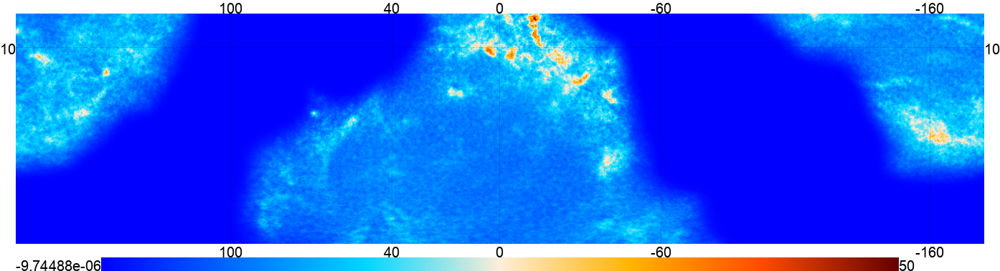

d10 ACT GAL060 mask


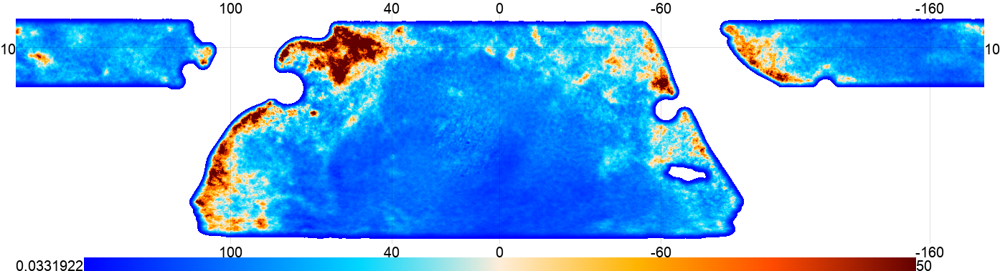

d10 Planck GAL060 mask


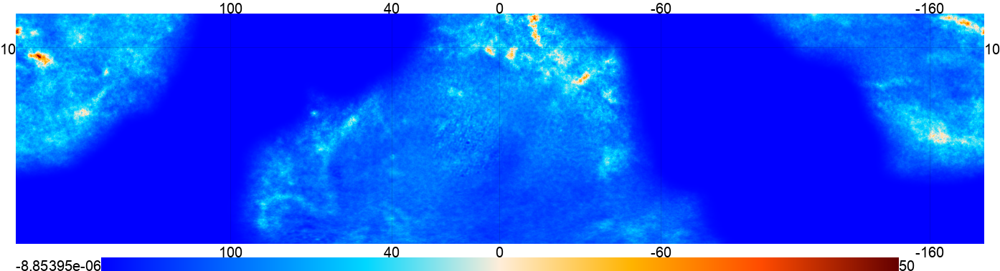

d12 ACT GAL060 mask


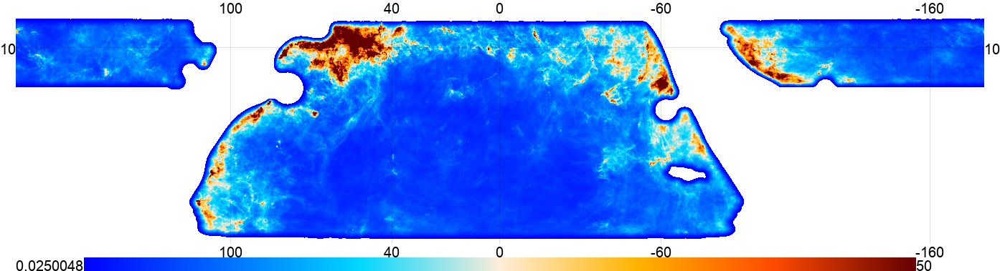

d12 Planck GAL060 mask


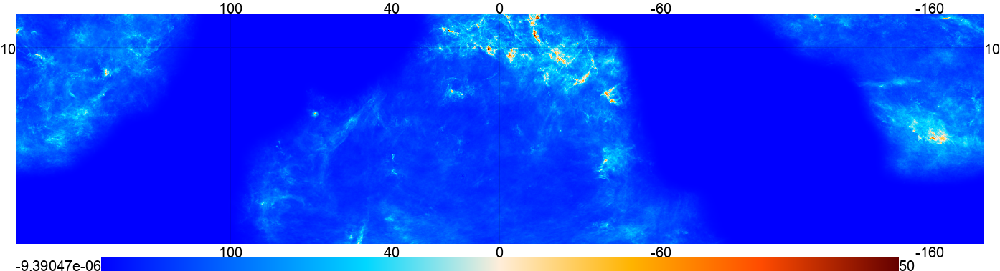

DF ACT GAL060 mask


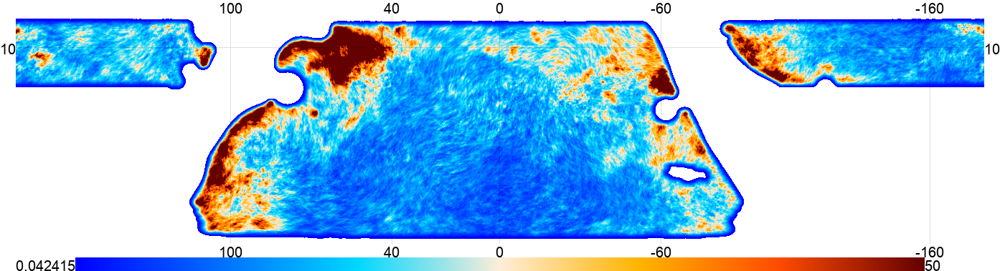

DF Planck GAL060 mask


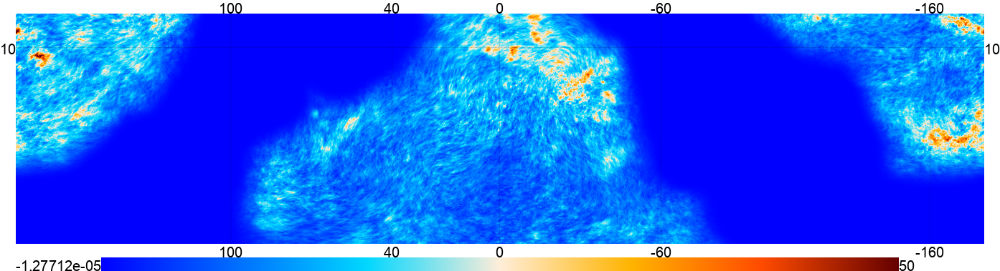

van ACT GAL060 mask


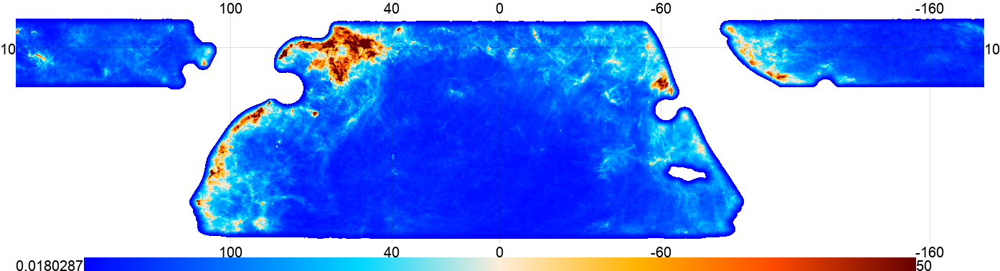

van Planck GAL060 mask


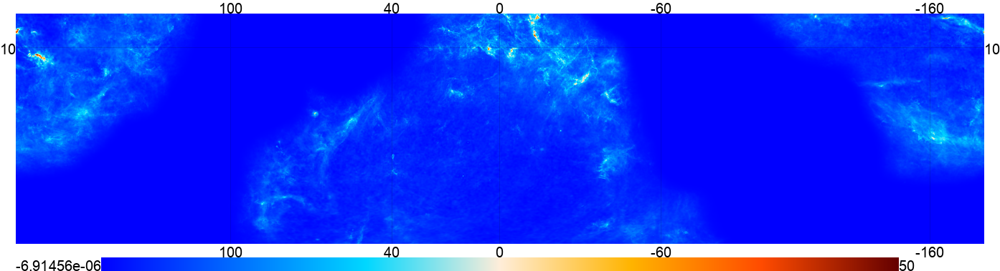

In [65]:
for dust_type in ['d9', 'd10', 'd12', 'DF','van']:
    print(dust_type, 'ACT GAL060 mask')
    mutils.eplot(sky_car_maps[f'{dust_type}_{args.skyfrac}'] * masks_pixell[fsky], max=50, downgrade=16, colorbar=True, ticks=100, mask =0, show=True)
    print(dust_type, 'Planck GAL060 mask')
    mutils.eplot(sky_car_maps[f'{dust_type}_{args.skyfrac}']*hp_car_GAL060 , max=50, downgrade=16, colorbar=True, ticks=100, mask =0, show=True)